# Тестовое по оттоку клиентов
## Выполнил Есен Гани

<div style="background-color: #1e1e1e; color: #569cd6; padding: 10px; border-radius: 5px;">
<strong style="color: #4ec9b0;">Анализ моделей машинного обучения для прогнозирования оттока клиентов</strong>
</div>

### <span style="color: #ce9178; font-weight: bold;">Использованные модели:</span>
* <span style="color:rgb(128, 180, 98);">Random Forest</span>
* <span style="color:rgb(33, 209, 209);">XgBoost</span>
* <span style="color:rgb(188, 231, 33);">Adaboost</span>
* <span style="color:rgb(206, 31, 31);">SVM</span>

In [11]:
import polars as pl
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as ex
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo
import warnings
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score as f1
from sklearn.model_selection import train_test_split, cross_val_score
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix
# import scikitplot as skplt
warnings.filterwarnings('ignore')
pyo.init_notebook_mode()
sns.set_style('darkgrid')

In [ ]:
# !pip install --upgrade scikit-plot

In [13]:
df = pd.read_csv("test.csv")
df.head()

,Unnamed: 0,client_id,target,age,gender,family_dependents,education_level,marital_status,income_category,card_category,...,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,change_in_trans_amount,total_trans_amt,total_trans_ct,change_in_trans_count,avg_utilization_ratio
0,0,768435383,Existing Customer,38,M,0,High School,Single,Less than $40K,Platinum,...,1,2,50000.0,10000,40000.0,0.300,15000000,25,0.200,0.100
1,1,741435323,Existing Customer,50,F,3,Graduate,Married,80𝐾−120K,Gold,...,3,500,30000.0,12000,18000.0,-0.200,20000,30,-0.100,0.350
2,0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Bronze,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
3,1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Bronze,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
4,2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Bronze,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000


#  1. Исследовательский анализ 

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10139 entries, 0 to 10138
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Unnamed: 0              10139 non-null  int64  
 1   client_id               10139 non-null  int64  
 2   target                  10139 non-null  object 
 3   age                     10139 non-null  int64  
 4   gender                  10139 non-null  object 
 5   family_dependents       10139 non-null  int64  
 6   education_level         10139 non-null  object 
 7   marital_status          10139 non-null  object 
 8   income_category         10139 non-null  object 
 9   card_category           10139 non-null  object 
 10  relationship_with_bank  10139 non-null  int64  
 11  total_products          10139 non-null  int64  
 12  months_inactive_12_mon  10139 non-null  int64  
 13  contacts_count_12_mon   10139 non-null  int64  
 14  credit_limit            10139 non-null

In [15]:
df.shape

(10139, 22)

In [16]:
df.dtypes

Unnamed: 0                  int64
client_id                   int64
target                     object
age                         int64
gender                     object
family_dependents           int64
education_level            object
marital_status             object
income_category            object
card_category              object
relationship_with_bank      int64
total_products              int64
months_inactive_12_mon      int64
contacts_count_12_mon       int64
credit_limit              float64
total_revolving_bal         int64
avg_open_to_buy           float64
change_in_trans_amount    float64
total_trans_amt             int64
total_trans_ct              int64
change_in_trans_count     float64
avg_utilization_ratio     float64
dtype: object

In [17]:
df.duplicated().sum()

0

In [18]:
fig = make_subplots(rows=2, cols=1)

box=go.Box(x=df['age'],name='Age box Plot',boxmean=True)
hyst=go.Histogram(x=df['age'],name='Гистограмма Возрастов')

fig.add_trace(box,row=1,col=1)
fig.add_trace(hyst,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Дистрибуция возрастов")
fig.show()

In [19]:

df["target"].value_counts()


target
Existing Customer    8510
Attrited Customer    1629
Name: count, dtype: int64

In [20]:
df.columns 


Index(['Unnamed: 0', 'client_id', 'target', 'age', 'gender',
       'family_dependents', 'education_level', 'marital_status',
       'income_category', 'card_category', 'relationship_with_bank',
       'total_products', 'months_inactive_12_mon', 'contacts_count_12_mon',
       'credit_limit', 'total_revolving_bal', 'avg_open_to_buy',
       'change_in_trans_amount', 'total_trans_amt', 'total_trans_ct',
       'change_in_trans_count', 'avg_utilization_ratio'],
      dtype='object')

In [21]:
ex.pie(df,names='education_level',title='Уровень образования',hole=0.33)

## Гипотеза:
1. Клиенты с высшим образованием могут иметь более стабильное финансовое положение и, возможно, меньшую склонность к оттоку.
2. Высокий процент клиентов со средним или отсутствующим образованием может сигнализировать о высоком риске оттока, особенно если они испытывают финансовые трудности.

In [22]:
ex.pie(df,names='income_category',title='Разные уровни заработка клиентов в процентном соотношении',hole=0.33)

## Гипотеза про Доход клиентов
1. Большая часть клиентов (35.2%) зарабатывает менее $40K. Это самая значительная группа. Такие клиенты могут быть более склонны к оттоку, особенно если они сталкиваются с финансовыми трудностями.
2. Второе место занимает категория с доходом $40K - $60K (17.7%). Это средний уровень дохода, и такие клиенты могут быть менее уязвимыми, чем первая группа.
3. Группа с доходом $80K - $120K составляет 15.2%, а $60K - $80K  -13.8%. Это категории клиентов с более высоким уровнем дохода, которые, вероятно, обладают большей финансовой стабильностью.
4. Неизвестный доход ("Unknown") составляет 11% – наличие такой доли неопределенных данных может усложнять анализ и предсказание оттока.
5. Доход свыше $120K (7.19%) и диапазон $80K - $120K (0.00986%) – это наименьшие группы. Скорее всего, клиенты с такими доходами менее склонны к оттоку, так как у них больше финансовых ресурсов.1

In [23]:
ex.pie(df,names='marital_status',title='Семейный статус ',hole=0.33)


In [24]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['total_trans_amt'],name='Boxplot',boxmean=True)
tr2=go.Histogram(x=df['total_trans_amt'],name='Гистограмма')
    
fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Распределение общей суммы транзакций за последние 12 месяцев")
fig.show()

## На графике сверху видны большие выбросы, надо разобраться с этим

In [25]:
df['total_trans_amt'].describe()


count    1.013900e+04
mean     5.886189e+03
std      1.489633e+05
min      5.100000e+02
25%      2.156000e+03
50%      3.901000e+03
75%      4.741500e+03
max      1.500000e+07
Name: total_trans_amt, dtype: float64

- Максимальная сумма транзакций (max) составляет 15 миллионов, что значительно превышает 75-й процентиль (4741.5).
- Среднее значение (mean) 5886, но стандартное отклонение (std) 148 963 указывает на сильную дисперсию, вызванную выбросами.

In [26]:
# df['log_total_trans_amt'] =  np.log1p(df['total_trans_amt'])
# пробовал log distribution чтобы уменьшить размерность, но не помогло 

In [27]:
df = df[df['total_trans_amt'] < 50000]  # Убираем слишком большие транзакции


In [28]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['total_trans_amt'],name='Boxplot',boxmean=True)
tr2=go.Histogram(x=df['total_trans_amt'],name='Гистограмма')
    
fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Распределение общей суммы транзакций за последние 12 месяцев")
fig.show()

## Теперь можно предположить что: 
- Большая часть клиентов совершает транзакции в диапазоне 1.5k - 6k, что можно считать нормой.
- Небольшая группа клиентов с высокими суммами (10k - 15k) – возможно, это премиальные клиенты или пользователи с высокой активностью.

In [29]:
df.columns

Index(['Unnamed: 0', 'client_id', 'target', 'age', 'gender',
       'family_dependents', 'education_level', 'marital_status',
       'income_category', 'card_category', 'relationship_with_bank',
       'total_products', 'months_inactive_12_mon', 'contacts_count_12_mon',
       'credit_limit', 'total_revolving_bal', 'avg_open_to_buy',
       'change_in_trans_amount', 'total_trans_amt', 'total_trans_ct',
       'change_in_trans_count', 'avg_utilization_ratio'],
      dtype='object')

In [30]:
ex.pie(df,names='target',title='Клиенты vs ушедших',hole=0.33)

### Таргетный класс не сбалинсированный, можем попробовать сделать upsampling позже

# 2. Preprocessing 

In [31]:
# категориальные целевые переменные преобразуем в бинарные
df.target = df.target.replace({'Attrited Customer': 1, 'Existing Customer': 0})


In [32]:
df.value_counts('target')

target
0    8509
1    1629
Name: count, dtype: int64

In [33]:
df.gender = df.gender.replace({'F': 1, 'M': 0})


In [34]:
df = pd.concat([df, pd.get_dummies(df['education_level']).drop(columns=['Unknown'])], axis=1)
df = pd.concat([df, pd.get_dummies(df['income_category']).drop(columns=['Unknown'])], axis=1)
df = pd.concat([df, pd.get_dummies(df['marital_status']).drop(columns=['Unknown'])], axis=1)
df = pd.concat([df, pd.get_dummies(df['card_category']).drop(columns=['Platinum'])], axis=1)


In [35]:
df.columns


Index(['Unnamed: 0', 'client_id', 'target', 'age', 'gender',
       'family_dependents', 'education_level', 'marital_status',
       'income_category', 'card_category', 'relationship_with_bank',
       'total_products', 'months_inactive_12_mon', 'contacts_count_12_mon',
       'credit_limit', 'total_revolving_bal', 'avg_open_to_buy',
       'change_in_trans_amount', 'total_trans_amt', 'total_trans_ct',
       'change_in_trans_count', 'avg_utilization_ratio', 'College',
       'Doctorate', 'Graduate', 'High School', 'Post-Graduate', 'Uneducated',
       '$120K +', '$40K - $60K', '$60K - $80K', '$80K - $120K', '80𝐾−120K',
       'Less than $40K', 'Divorced', 'Married', 'Single', 'Bronze', 'Gold',
       'Silver'],
      dtype='object')

In [36]:
df.drop(columns = ['Unnamed: 0', 'education_level','income_category','marital_status','card_category'],inplace=True)

## 
- Категориальные данные преобразовал в one-hot encoding
- Целевая переменная (target) переведена в 0 и 1 
- Пол закодирован в 0 и 1.


### Корреляция переменных

In [37]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Pearson Correaltion',  'Spearman Correaltion'))
colorscale=     [[1.0              , "rgb(165,0,38)"],
                [0.8888888888888888, "rgb(215,48,39)"],
                [0.7777777777777778, "rgb(244,109,67)"],
                [0.6666666666666666, "rgb(253,174,97)"],
                [0.5555555555555556, "rgb(254,224,144)"],
                [0.4444444444444444, "rgb(224,243,248)"],
                [0.3333333333333333, "rgb(171,217,233)"],
                [0.2222222222222222, "rgb(116,173,209)"],
                [0.1111111111111111, "rgb(69,117,180)"],
                [0.0               , "rgb(49,54,149)"]]

s_val =df.corr('pearson')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=0.7,ygap=0.7,colorscale=colorscale),
    row=1, col=1
)


s_val =df.corr('spearman')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,xgap=0.7,ygap=0.7,colorscale=colorscale),
    row=2, col=1
)
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    )
)
fig.update_layout(height=700, width=900, title_text="Numeric Correaltions")
fig.show()

- Total_Trans_Amt  имеет сильную положительную корреляцию с Total_Trans_Ct (количество транзакций).
- Months_Inactive_12_mon коррелирует с Attrition_Flag, что логично – клиенты, которые давно не пользовались услугами, могут уйти.

## Upsampling

### Мы используем upsampling, потому-что это техника обработки несбалансированных данных, при которой увеличивается количество наблюдений миноритарного класс, в данном случае у нас меньше ушедших клиентов в датасете. Применять буду SMOTE. Это техника обработки несбалансированных данных, при которой увеличивается количество наблюдений миноритарного класс

Как мы помним, у нас дисбаланс классов в таргете

In [38]:
oversample = SMOTE()
target_col = 'target'  
X_cols = df.columns.difference(['client_id', target_col])  

X, y = oversample.fit_resample(df[X_cols], df[target_col])
unsampled_df = X.assign(Churn=y)


In [39]:
# проверил сколько строк для каждого класса 
print(unsampled_df['Churn'].value_counts())


Churn
0    8509
1    8509
Name: count, dtype: int64


In [40]:
# df.columns

In [41]:
ohe_cols = [col for col in unsampled_df.columns if col.startswith(('Graduate', 'High School', 'Married', 'Divorced', 'Income', 'Card'))]
ohe_data = unsampled_df[ohe_cols].copy()
unsampled_df = unsampled_df.drop(columns=ohe_cols)


In [42]:
# Выбираем только OHE-категории
ohe_cols = [col for col in unsampled_df.columns if col in [
    '$120K +', '$40K - $60K', '$60K - $80K', '$80K - $120K', '80K–120K',
    'Bronze', 'College', 'Doctorate', 'Gold', 'Less than $40K', 'Post-Graduate'
]]

ohe_data = unsampled_df[ohe_cols].copy()

unsampled_df = unsampled_df.drop(columns=ohe_cols)

print("После исправления признаки в usampled_df:", unsampled_df.columns)


После исправления признаки в usampled_df: Index(['80𝐾−120K', 'Silver', 'Single', 'Uneducated', 'age', 'avg_open_to_buy',
       'avg_utilization_ratio', 'change_in_trans_amount',
       'change_in_trans_count', 'contacts_count_12_mon', 'credit_limit',
       'family_dependents', 'gender', 'months_inactive_12_mon',
       'relationship_with_bank', 'total_products', 'total_revolving_bal',
       'total_trans_amt', 'total_trans_ct', 'Churn'],
      dtype='object')


In [43]:
print("Типы данных в usampled_df:\n", unsampled_df.dtypes)


Типы данных в usampled_df:
 80𝐾−120K                     bool
Silver                       bool
Single                       bool
Uneducated                   bool
age                         int64
avg_open_to_buy           float64
avg_utilization_ratio     float64
change_in_trans_amount    float64
change_in_trans_count     float64
contacts_count_12_mon       int64
credit_limit              float64
family_dependents           int64
gender                      int64
months_inactive_12_mon      int64
relationship_with_bank      int64
total_products              int64
total_revolving_bal         int64
total_trans_amt             int64
total_trans_ct              int64
Churn                       int64
dtype: object


In [44]:
print("Колонки в usampled_df после удаления OHE-категорий:\n", unsampled_df.columns)


Колонки в usampled_df после удаления OHE-категорий:
 Index(['80𝐾−120K', 'Silver', 'Single', 'Uneducated', 'age', 'avg_open_to_buy',
       'avg_utilization_ratio', 'change_in_trans_amount',
       'change_in_trans_count', 'contacts_count_12_mon', 'credit_limit',
       'family_dependents', 'gender', 'months_inactive_12_mon',
       'relationship_with_bank', 'total_products', 'total_revolving_bal',
       'total_trans_amt', 'total_trans_ct', 'Churn'],
      dtype='object')


In [45]:
# Убираем все OHE-категории из основного датасета
unsampled_df = unsampled_df.drop(columns=ohe_cols, errors='ignore')



In [46]:
value_counts = df[df.columns[0]].value_counts()
print("Распределение классов до SMOTE:", value_counts)


Распределение классов до SMOTE: client_id
708387933    2
778632933    2
718333983    2
721174008    2
809307108    2
            ..
712521783    1
780045708    1
719488008    1
771575058    1
714337233    1
Name: count, Length: 10128, dtype: int64


In [47]:
if 'target' in df.columns:
    target_col = 'target'
elif 'Target' in df.columns:
    target_col = 'Target'
elif 'Churn' in df.columns:
    target_col = 'Churn'
elif 'churn' in df.columns:
    target_col = 'churn'
else:
    print("Целевая переменная 'target' или 'Churn' не найдена.")
    print("Доступные колонки:", df.columns.tolist())
    target_col = input("Введите имя колонки с целевой переменной: ")

print(f"Используем {target_col} как целевую переменную")
value_counts = df[target_col].value_counts()
print("Распределение классов до SMOTE:", value_counts)

feature_cols = [col for col in df.columns if col != target_col]

from imblearn.over_sampling import SMOTE

if min(value_counts) < 6:
    oversample = SMOTE(k_neighbors=min(min(value_counts)-1, 5))
else:
    oversample = SMOTE()

X = df[feature_cols]  
y = df[target_col]    

X_resampled, y_resampled = oversample.fit_resample(X, y)
unsampled_df = X_resampled.copy()
unsampled_df[target_col] = y_resampled

Используем target как целевую переменную
Распределение классов до SMOTE: target
0    8509
1    1629
Name: count, dtype: int64


In [ ]:
# Проверяем наличие целевой переменной 'target' или 'Churn'
if 'target' in df.columns:
    target_col = 'target'
elif 'Target' in df.columns:
    target_col = 'Target'
elif 'Churn' in df.columns:
    target_col = 'Churn'
elif 'churn' in df.columns:
    target_col = 'churn'
else:
    print("Целевая переменная 'target' или 'Churn' не найдена.")
    print("Доступные колонки:", df.columns.tolist())
    target_col = input("Введите имя колонки с целевой переменной: ")

print(f"Используем {target_col} как целевую переменную")
value_counts = df[target_col].value_counts()
print("Распределение классов до SMOTE:", value_counts)

feature_cols = [col for col in df.columns if col != target_col]

# Настраиваем SMOTE в зависимости от количества образцов
if min(value_counts) < 6:
    oversample = SMOTE(k_neighbors=min(min(value_counts)-1, 5))
else:
    oversample = SMOTE()

X = df[feature_cols]  
y = df[target_col]    

# Выполняем апсэмплинг
X_resampled, y_resampled = oversample.fit_resample(X, y)
unsampled_df = X_resampled.copy()
unsampled_df[target_col] = y_resampled

Используем target как целевую переменную
Распределение классов до SMOTE: target
0    8509
1    1629
Name: count, dtype: int64


In [49]:
print("Распределение классов после SMOTE:")
print(unsampled_df[target_col].value_counts())

Распределение классов после SMOTE:
target
0    8509
1    8509
Name: count, dtype: int64


In [50]:
# Копируем OHE данные (столбцы с 15 до предпоследнего)
ohe_data = unsampled_df[unsampled_df.columns[15:-1]].copy()

# Удаляем OHE данные из основного датафрейма
unsampled_df = unsampled_df.drop(columns=unsampled_df.columns[15:-1])

# Выводим информацию о размерах полученных датафреймов
print(f"Размер основного датафрейма после удаления OHE: {unsampled_df.shape}")
print(f"Размер OHE данных: {ohe_data.shape}")

# Проверяем, какие столбцы остались в основном датафрейме
print("\nСтолбцы, оставшиеся в основном датафрейме:")
print(unsampled_df.columns.tolist())

Размер основного датафрейма после удаления OHE: (17018, 16)
Размер OHE данных: (17018, 19)

Столбцы, оставшиеся в основном датафрейме:
['client_id', 'age', 'gender', 'family_dependents', 'relationship_with_bank', 'total_products', 'months_inactive_12_mon', 'contacts_count_12_mon', 'credit_limit', 'total_revolving_bal', 'avg_open_to_buy', 'change_in_trans_amount', 'total_trans_amt', 'total_trans_ct', 'change_in_trans_count', 'target']


In [51]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Pearson Correaltion',  'Spearman Correaltion'))
colorscale=     [[1.0              , "rgb(165,0,38)"],
                [0.8888888888888888, "rgb(215,48,39)"],
                [0.7777777777777778, "rgb(244,109,67)"],
                [0.6666666666666666, "rgb(253,174,97)"],
                [0.5555555555555556, "rgb(254,224,144)"],
                [0.4444444444444444, "rgb(224,243,248)"],
                [0.3333333333333333, "rgb(171,217,233)"],
                [0.2222222222222222, "rgb(116,173,209)"],
                [0.1111111111111111, "rgb(69,117,180)"],
                [0.0               , "rgb(49,54,149)"]]

s_val =unsampled_df.corr('pearson')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=1,ygap=1,colorscale=colorscale),
    row=1, col=1
)


s_val =unsampled_df.corr('spearman')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,xgap=1,ygap=1,colorscale=colorscale),
    row=2, col=1
)
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    )
)
fig.update_layout(height=700, width=900, title_text="Upsmapled Correlations")
fig.show()

- `target` теперь сбалансирован по классам, и связи стали более выраженными.
- Убраны лишние категориальные признаки (доход, образование, семейное положение), они могли мешать интерпретации.

In [52]:
ohe_data.head()

,avg_utilization_ratio,College,Doctorate,Graduate,High School,Post-Graduate,Uneducated,$120K +,$40K - $60K,$60K - $80K,$80K - $120K,80𝐾−120K,Less than $40K,Divorced,Married,Single,Bronze,Gold,Silver
0,0.350,False,False,True,False,False,False,False,False,False,False,True,False,False,True,False,False,True,False
1,0.061,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False,True,False,False
2,0.105,False,False,True,False,False,False,False,False,False,False,False,True,False,False,True,True,False,False
3,0.000,False,False,True,False,False,False,False,False,False,True,False,False,False,True,False,True,False,False
4,0.760,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,True,False,False


In [53]:
N_COMPONENTS = 10

pca_model = PCA(n_components = N_COMPONENTS )

pc_matrix = pca_model.fit_transform(ohe_data)

evr = pca_model.explained_variance_ratio_
total_var = evr.sum() * 100
cumsum_evr = np.cumsum(evr)

trace1 = {
    "name": "individual explained variance", 
    "type": "bar", 
    'y':evr}
trace2 = {
    "name": "cumulative explained variance", 
    "type": "scatter", 
     'y':cumsum_evr}
data = [trace1, trace2]
layout = {
    "xaxis": {"title": "Principal components"}, 
    "yaxis": {"title": "Explained variance ratio"},
  }
fig = go.Figure(data=data, layout=layout)
fig.update_layout(     title='Explained Variance Using {} Dimensions'.format(N_COMPONENTS))
fig.show()

In [ ]:
unsampled_df_with_pcs = pd.concat([unsampled_df,pd.DataFrame(pc_matrix,columns=['PC-{}'.format(i) for i in range(0,N_COMPONENTS)])],axis=1)

In [ ]:
fig = ex.scatter_matrix(
    unsampled_df_with_pcs[['PC-{}'.format(i) for i in range(0,N_COMPONENTS)]].values,
    color=
    .credit_limit,
    dimensions=range(N_COMPONENTS),
    labels={str(i):'PC-{}'.format(i) for i in range(0,N_COMPONENTS)},
    title=f'Total Explained Variance: {total_var:.2f}%')

fig.update_traces(diagonal_visible=False)
fig.update_layout(
    coloraxis_colorbar=dict(
        title="credit_limit",
    ),
)
fig.show()

увеличение компонентов дало результат получше, при 10 компонентов получаем такой результат, из минусов мы усложняем модель и увеличиваем его размерность 


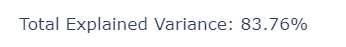

In [56]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Pearson Correaltion',  'Spearman Correaltion'))


s_val =unsampled_df_with_pcs.corr('pearson')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=1,ygap=1,colorscale=colorscale),
    row=1, col=1
)


s_val =unsampled_df_with_pcs.corr('spearman')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,xgap=1,ygap=1,colorscale=colorscale),
    row=2, col=1
)
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    )
)
fig.update_layout(height=700, width=900, title_text="Upsmapled Correlations With PC\'s")
fig.show()

In [57]:
unsampled_df_with_pcs.columns

Index(['client_id', 'age', 'gender', 'family_dependents',
       'relationship_with_bank', 'total_products', 'months_inactive_12_mon',
       'contacts_count_12_mon', 'credit_limit', 'total_revolving_bal',
       'avg_open_to_buy', 'change_in_trans_amount', 'total_trans_amt',
       'total_trans_ct', 'change_in_trans_count', 'target', 'PC-0', 'PC-1',
       'PC-2', 'PC-3', 'PC-4', 'PC-5', 'PC-6', 'PC-7', 'PC-8', 'PC-9'],
      dtype='object')

In [58]:
best_correlations = [
    'age',    
    'credit_limit', 
    'avg_open_to_buy', 
    'total_trans_amt', 
    'total_trans_ct',
    'change_in_trans_count', 
    'months_inactive_12_mon', 
    'relationship_with_bank', 
    'PC-1',  
    'PC-4'
]
X = unsampled_df_with_pcs[best_correlations]
y = unsampled_df_with_pcs['target']


### делаем train_test_split

In [59]:
train_x,test_x,train_y,test_y = train_test_split(X,y,random_state=42)

## пробуем разные алгоритмы и используем кросс валидацию 

In [60]:
rf_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",RandomForestClassifier(random_state=42)) ])
ada_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",AdaBoostClassifier(random_state=42,learning_rate=0.7)) ])
svm_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",SVC(random_state=42,kernel='rbf')) ])
xgb_pipe = Pipeline(steps=[('scale', StandardScaler()), ("XGB", XGBClassifier(random_state=42, learning_rate=0.2, n_estimators=100))])

f1_cross_val_scores = cross_val_score(rf_pipe,train_x,train_y,cv=5,scoring='f1')
ada_f1_cross_val_scores=cross_val_score(ada_pipe,train_x,train_y,cv=5,scoring='f1')
svm_f1_cross_val_scores=cross_val_score(svm_pipe,train_x,train_y,cv=5,scoring='f1')
xgb_f1_cross_val_scores = cross_val_score(xgb_pipe, train_x, train_y, cv=5, scoring='f1')


In [ ]:
#subplots with 4 rows instead of 3
fig = make_subplots(
    rows=4,  # Explicitly define 4 rows
    cols=1,
    shared_xaxes=True,
    subplot_titles=(
        'Random Forest Cross Val Scores',
          'XGBoost Cross Val Scores',
        'Adaboost Cross Val Scores',
        'SVM Cross Val Scores'
      
    )
)


fig.add_trace(
    go.Scatter(x=list(range(0,len(f1_cross_val_scores))),y=f1_cross_val_scores,name='Random Forest'),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=list(range(0,len(ada_f1_cross_val_scores))),y=ada_f1_cross_val_scores,name='Adaboost'),
    row=2, col=1
)
fig.add_trace(
    go.Scatter(x=list(range(0,len(svm_f1_cross_val_scores))),y=svm_f1_cross_val_scores,name='SVM'),
    row=3, col=1
)
fig.add_trace(
    go.Scatter(x=list(range(0,len(xgb_f1_cross_val_scores))),y=xgb_f1_cross_val_scores,name='XGBoost'),
    row=4, col=1
)

fig.update_layout(height=900, width=900, title_text="Different Model 5 Fold Cross Validation")
fig.update_yaxes(title_text="F1 Score")
fig.update_xaxes(title_text="Fold #")

fig.show()

## Оценка модели

In [62]:
rf_pipe.fit(train_x,train_y)
rf_prediction = rf_pipe.predict(test_x)

ada_pipe.fit(train_x,train_y)
ada_prediction = ada_pipe.predict(test_x)

svm_pipe.fit(train_x,train_y)
svm_prediction = svm_pipe.predict(test_x)

xgb_pipe.fit(train_x, train_y)
xgb_prediction = xgb_pipe.predict(test_x)


In [63]:
fig = go.Figure(data=[go.Table(header=dict(values=['<b>Model<b>', '<b>F1 Score On Test Data<b>'],
                                           line_color='darkslategray',
    fill_color='whitesmoke',
    align=['center','center'],
    font=dict(color='black', size=18),
    height=40),
                               
                 cells=dict(values=[['<b>Random Forest<b>', '<b>XgBoost','<b>AdaBoost<b>','<b>SVM<b>'], [(f1(rf_prediction,test_y),2), 
                                                                          (f1(xgb_prediction,test_y),2),
                                                                          np.round(f1(ada_prediction,test_y),2),
                                                                          np.round(f1(svm_prediction,test_y),2)]]))
                     ])

fig.update_layout(title='Model Results On Test Data')
fig.show()

### Здесь видно, что xgboost и RF хорошо справляются и у них высокий F1-score

## Готовлю данные к трейну модели без апсемлинга

In [74]:
ohe_data = df[df.columns[16:]].copy()
pc_matrix = pca_model.fit_transform(ohe_data)
original_df_with_pcs = pd.concat([df, pd.DataFrame(pc_matrix, columns=['PC-{}'.format(i) for i in range(0, N_COMPONENTS)])], axis=1)

In [ ]:
cleaned_df = original_df_with_pcs[best_correlations].dropna()
unsampled_data_prediction_RF = rf_pipe.predict(cleaned_df)
unsampled_data_prediction_ADA = ada_pipe.predict(cleaned_df)
unsampled_data_prediction_SVM = svm_pipe.predict(cleaned_df)
unsampled_data_prediction_XGB = xgb_pipe.predict(cleaned_df)

# Fill missing values with column means
filled_df = original_df_with_pcs[best_correlations].fillna(original_df_with_pcs[best_correlations].mean())
unsampled_data_prediction_RF = rf_pipe.predict(filled_df)
unsampled_data_prediction_ADA = ada_pipe.predict(filled_df)
unsampled_data_prediction_SVM = svm_pipe.predict(filled_df)
unsampled_data_prediction_XGB = xgb_pipe.predict(filled_df)

In [77]:
print("RF prediction unique values:", np.unique(unsampled_data_prediction_RF))
print("RF prediction shape:", unsampled_data_prediction_RF.shape)

nan_indices_rf = np.where(np.isnan(unsampled_data_prediction_RF))[0]
print("Индексы с NaN в RF предсказаниях:", nan_indices_rf)
print("Количество NaN значений:", len(nan_indices_rf))

print("Target shape:", original_df_with_pcs['target'].shape)
print("Target unique values:", original_df_with_pcs['target'].unique())

RF prediction unique values: [0 1]
RF prediction shape: (10139,)
Индексы с NaN в RF предсказаниях: []
Количество NaN значений: 0
Target shape: (10139,)
Target unique values: [ 0.  1. nan]


### Здесь я сравниваю результаты моделей без ансэмплинга. Если помните, то изначально был дисбаланс классов. 

In [ ]:

valid_target_mask = ~np.isnan(original_df_with_pcs['target'])
target_clean = original_df_with_pcs.loc[valid_target_mask, 'target']

rf_clean_pred = unsampled_data_prediction_RF[valid_target_mask]
ada_clean_pred = unsampled_data_prediction_ADA[valid_target_mask]
svm_clean_pred = unsampled_data_prediction_SVM[valid_target_mask]
xgb_clean_pred = unsampled_data_prediction_XGB[valid_target_mask]

print("Размер очищенной целевой переменной:", target_clean.shape)
print("Размер очищенных RF предсказаний:", rf_clean_pred.shape)

fig = go.Figure(data=[go.Table(
    header=dict(
        values=['<b>Модель<b>', '<b>F1 Score на исходных данных (без апсемплинга)<b>'],
        line_color='darkslategray',
        fill_color='whitesmoke',
        align=['center','center'],
        font=dict(color='black', size=18),
        height=40
    ),
    cells=dict(
        values=[
            ['<b>Random Forest<b>', '<b>XGBoost<b>', '<b>AdaBoost<b>', '<b>SVM<b>'],
            [
                np.round(f1(rf_clean_pred, target_clean), 2),
                np.round(f1(xgb_clean_pred, target_clean), 2),
                np.round(f1(ada_clean_pred, target_clean), 2),
                np.round(f1(svm_clean_pred, target_clean), 2)
            ]
        ]
    )
)])

fig.update_layout(title='Результаты моделей на исходных данных (без апсемплинга)')
fig.show()

Размер очищенной целевой переменной: (10138,)
Размер очищенных RF предсказаний: (10138,)


### Как и ожидалось перфоманс моделей значительно ухудшился без апсэмплинга

# Результаты 

In [ ]:
print("NaN в XGB предсказаниях:", np.isnan(unsampled_data_prediction_XGB).any())
print("Количество NaN:", np.isnan(unsampled_data_prediction_XGB).sum())

xgb_pred_clean = np.nan_to_num(unsampled_data_prediction_XGB, nan=0)
print("NaN после очистки:", np.isnan(xgb_pred_clean).any())

NaN в XGB предсказаниях: False
Количество NaN: 0
NaN после очистки: False


In [ ]:
valid_target_mask = ~np.isnan(original_df_with_pcs['target'])
target_clean = original_df_with_pcs.loc[valid_target_mask, 'target']
xgb_pred_for_matrix = xgb_pred_clean[valid_target_mask]

z = confusion_matrix(xgb_pred_for_matrix, target_clean)
fig = ff.create_annotated_heatmap(z, x=['Not Churn','Churn'], y=['Predicted Not Churn','Predicted Churn'], colorscale='Fall', xgap=3, ygap=3)
fig['data'][0]['showscale'] = True
fig.update_layout(title='Prediction On Original Data With XGBoost Model Confusion Matrix')
fig.show()

Это без апсэмплинга: общая точность (accuracy) около 89.1% [(7420 + 1568) / (7420 + 1568 + 1089 + 61)]

In [88]:
# First, check the shapes of your arrays
print("Shape of unsampled_df_with_pcs:", unsampled_df_with_pcs.shape)
print("Shape of xgb_pred_clean:", xgb_pred_clean.shape)

Shape of unsampled_df_with_pcs: (17018, 26)
Shape of xgb_pred_clean: (10139,)


In [ ]:
# Generate new predictions specifically for the upsampled dataframe
xgb_pred_for_upsampled = xgb_pipe.predict(unsampled_df_with_pcs[best_correlations].fillna(unsampled_df_with_pcs[best_correlations].mean()))

valid_target_mask = ~np.isnan(unsampled_df_with_pcs['target'])
target_clean = unsampled_df_with_pcs.loc[valid_target_mask, 'target']
xgb_pred_for_matrix = xgb_pred_for_upsampled[valid_target_mask]

z = confusion_matrix(xgb_pred_for_matrix, target_clean)
fig = ff.create_annotated_heatmap(z, x=['Not Churn','Churn'], y=['Predicted Not Churn','Predicted Churn'], 
                               colorscale='Fall', xgap=3, ygap=3)
fig['data'][0]['showscale'] = True
fig.update_layout(title='Prediction On Upsampled Data With XGBoost Model Confusion Matrix')
fig.show()

Общая точность (accuracy) около 98% [(8302 + 8373) / (8302 + 8373 + 207 + 136)]

Существенно выше, чем у модели без апсемплинга (89.1%)

# Вывод

- Наилучший результат на тестовых данных показала модель XGBoost с F1-score около 0.95
- Random Forest показал схожий результат с F1-score также около 0.95 
- Апсемплинг значительно улучшил качество модели XGBoost
- Общая точность (accuracy) выросла с 89.1% до 98%
- Число ложноположительных предсказаний уменьшилось с 1089 до 207
- Модель стала гораздо лучше определять как лояльных клиентов, так и клиентов с оттоком



### Здесь я изнально хотел использовать эту технику для отбора признаков 

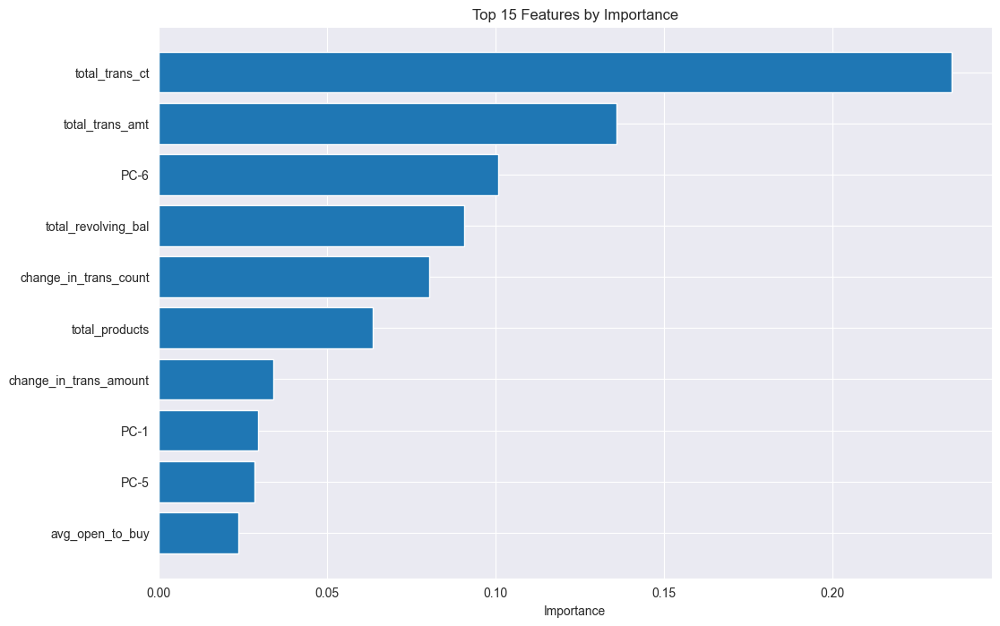

Топ-10 признаков: ['total_trans_ct', 'total_trans_amt', 'PC-6', 'total_revolving_bal', 'change_in_trans_count', 'total_products', 'change_in_trans_amount', 'PC-1', 'PC-5', 'avg_open_to_buy']


In [ ]:


X_all = unsampled_df_with_pcs.drop(['target'], axis=1)
y = unsampled_df_with_pcs['target']

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_all, y)

feature_importance = pd.DataFrame({
    'feature': X_all.columns,
    'importance': rf.feature_importances_
}).sort_values('importance', ascending=False)

plt.figure(figsize=(12, 8))
plt.barh(feature_importance['feature'][:10], feature_importance['importance'][:10])
plt.xlabel('Importance')
plt.title('Top 15 Features by Importance')
plt.gca().invert_yaxis()
plt.show()

# Выбираем топ-N признаков
top_features = feature_importance['feature'][:10].tolist()
print("Топ-10 признаков:", top_features)

In [ ]:
X_features = [
    'total_trans_ct',        
    'total_trans_amt',      
    'PC-6',                 
    'total_revolving_bal',   
    'change_in_trans_count', 
    'total_products',     
    'change_in_trans_amount',
    'PC-1',             
    'PC-5'                 
]

X = unsampled_df_with_pcs[X_features]
y = unsampled_df_with_pcs['target']  я